In [ ]:
import numpy as np
import pandas as pd
import matplotlib
import plotly
import tensorflow as tf
import PIL

print(f"numpy version: {np.__version__}")
print(f"pandas version: {pd.__version__}")
print(f"matplotlib version: {matplotlib.__version__}")
print(f"plotly version: {plotly.__version__}")
print(f"tensorflow version: {tf.__version__}")
print(f"PIL version: {PIL.__version__}")


numpy version: 1.22.4
pandas version: 1.5.3
matplotlib version: 3.7.1
plotly version: 5.13.1
tensorflow version: 2.12.0
PIL version: 8.4.0


In [ ]:
import random
import os
import time
import warnings
warnings.filterwarnings("ignore")
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline
import plotly.express as px
import tensorflow as tf
import tensorflow_hub as hub
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint
from tensorflow.keras.layers import Flatten, Dense, BatchNormalization, Activation, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import plot_model
from tensorflow.keras import Model


In [ ]:
TRAINING_DIR = '/content/drive/MyDrive/clothes classification/images_compressed'
BATCH_SIZE = 32
IMAGE_SIZE = (224, 224)
EPOCHS = 100
LEARNING_RATE = 0.001

In [ ]:
optimizer = Adam(learning_rate=LEARNING_RATE)

In [ ]:
print(f"There are {len(os.listdir(TRAINING_DIR))} images in training set")

There are 5762 images in training set


In [ ]:
#list the names of first 10 files within the directory specified.
file_names = os.listdir(TRAINING_DIR)
file_names[:10]

['d61893a4-ce8b-4e29-8928-727482d051cf.jpg',
 'be4e12cd-1a81-4ddb-93f3-5f29a24b7eb6.jpg',
 'bd5e83fc-330b-4526-8c04-3b7eef715af2.jpg',
 'bc524ee8-429f-4b41-ab80-c54a63a3db8d.jpg',
 'b8f3af98-e650-4f59-a3f3-513a1c5ec418.jpg',
 'dbc4857e-763b-40b5-82a8-329f2686ec39.jpg',
 'cb5922ee-829e-4356-aaf5-3233cf1b948a.jpg',
 'd6d098c7-8f6c-45e0-a287-9b5bbc2f256d.jpg',
 'd5c7bcbc-a40b-4eb4-9c9d-e2e384a12f0d.jpg',
 'b944fd03-37b3-46fc-b4c5-3ee35e1d64fa.jpg']

In [ ]:
#read a CSV file and load it into a Pandas DataFrame.
data = pd.read_csv('/content/drive/MyDrive/clothes classification/images.csv')

In [ ]:
data.head()

,image,sender_id,label,kids
0,4285fab0-751a-4b74-8e9b-43af05deee22,124,Not sure,False
1,ea7b6656-3f84-4eb3-9099-23e623fc1018,148,T-Shirt,False
2,00627a3f-0477-401c-95eb-92642cbe078d,94,Not sure,False
3,ea2ffd4d-9b25-4ca8-9dc2-bd27f1cc59fa,43,T-Shirt,False
4,3b86d877-2b9e-4c8b-a6a2-1d87513309d0,189,Shoes,False


In [ ]:
#Adding the file extension .jpg to the values in the image column of the data DataFrame.
#creates a new DataFrame by selecting specific columns from the data DataFrame.
data['image'] = data['image']+'.jpg'
data_1 = data[['image', 'label']]

In [ ]:
data_1.head()

,image,label
0,4285fab0-751a-4b74-8e9b-43af05deee22.jpg,Not sure
1,ea7b6656-3f84-4eb3-9099-23e623fc1018.jpg,T-Shirt
2,00627a3f-0477-401c-95eb-92642cbe078d.jpg,Not sure
3,ea2ffd4d-9b25-4ca8-9dc2-bd27f1cc59fa.jpg,T-Shirt
4,3b86d877-2b9e-4c8b-a6a2-1d87513309d0.jpg,Shoes


In [ ]:
# access the 'image' column of the DataFrame data_1 and retrieve its values.
data_1['image']

0       4285fab0-751a-4b74-8e9b-43af05deee22.jpg
1       ea7b6656-3f84-4eb3-9099-23e623fc1018.jpg
2       00627a3f-0477-401c-95eb-92642cbe078d.jpg
3       ea2ffd4d-9b25-4ca8-9dc2-bd27f1cc59fa.jpg
4       3b86d877-2b9e-4c8b-a6a2-1d87513309d0.jpg
                          ...                   
5398    dfd4079d-967b-4b3e-8574-fbac11b58103.jpg
5399    befa14be-8140-4faf-8061-1039947e329d.jpg
5400    5379356a-40ee-4890-b416-2336a7d84061.jpg
5401    65507fb8-3456-4c15-b53e-d1b03bf71a59.jpg
5402    32b99302-cec7-4dec-adfa-3d4029674209.jpg
Name: image, Length: 5403, dtype: object

In [ ]:
#Import Python Imaging Library
import PIL
#Import the Path class from the pathlib module
from pathlib import Path

#Creates a Path object using the TRAINING_DIR variable
path = Path(TRAINING_DIR).rglob("*.jpg")
corrupted = []

for img_p in path:
    try:
        img = PIL.Image.open(img_p)
    except PIL.UnidentifiedImageError:
        print(f"Corrupted file: {img_p}")
        corrupted.append(str(img_p))

print(f"Total corrupted files: {len(corrupted)}")

# Access the file paths of corrupted files separately
print("Corrupted file paths:")
for filepath in corrupted:
    print(filepath)

Corrupted file: /content/drive/MyDrive/clothes classification/images_compressed/c60e486d-10ed-4f64-abab-5bb698c736dd.jpg
Corrupted file: /content/drive/MyDrive/clothes classification/images_compressed/d028580f-9a98-4fb5-a6c9-5dc362ad3f09.jpg
Corrupted file: /content/drive/MyDrive/clothes classification/images_compressed/b72ed5cd-9f5f-49a7-b12e-63a078212a17.jpg
Corrupted file: /content/drive/MyDrive/clothes classification/images_compressed/784d67d4-b95e-4abb-baf7-8024f18dc3c8.jpg
Corrupted file: /content/drive/MyDrive/clothes classification/images_compressed/1d0129a1-f29a-4a3f-b103-f651176183eb.jpg
Corrupted file: /content/drive/MyDrive/clothes classification/images_compressed/040d73b7-21b5-4cf2-84fc-e1a80231b202.jpg
Total corrupted files: 6
Corrupted file paths:
/content/drive/MyDrive/clothes classification/images_compressed/c60e486d-10ed-4f64-abab-5bb698c736dd.jpg
/content/drive/MyDrive/clothes classification/images_compressed/d028580f-9a98-4fb5-a6c9-5dc362ad3f09.jpg
/content/drive/My

In [ ]:
# Remove rows corresponding to corrupted image files from the dataset
data_1 = data_1.drop(data_1[data_1['image'].isin(corrupted)].index, axis=0)

In [ ]:
import plotly.express as px

# Calculate label frequencies
label_counts = data_1['label'].value_counts()

# Create a DataFrame with label frequencies
label_df = pd.DataFrame({'label': label_counts.index, 'count': label_counts.values})

# Create the pie chart
fig = px.pie(label_df, values='count', names='label', title='Label Distribution')

# Show the pie chart
fig.show()

In [ ]:
#Extracting unique class names
class_names = list(data_1['label'].unique())

print(f"Total number of classes: {len(class_names)}")
print("Unique class names:")
for i, class_name in enumerate(class_names, 1):
    print(f"{i}. {class_name}")

Total number of classes: 20
Unique class names:
1. Not sure
2. T-Shirt
3. Shoes
4. Shorts
5. Shirt
6. Pants
7. Skirt
8. Other
9. Top
10. Outwear
11. Dress
12. Body
13. Longsleeve
14. Undershirt
15. Hat
16. Polo
17. Blouse
18. Hoodie
19. Skip
20. Blazer


In [ ]:
#Creating Class Dictionary
class_dict = dict(zip(class_names, range(len(class_names))))

In [ ]:
class_dict

{'Not sure': 0,
 'T-Shirt': 1,
 'Shoes': 2,
 'Shorts': 3,
 'Shirt': 4,
 'Pants': 5,
 'Skirt': 6,
 'Other': 7,
 'Top': 8,
 'Outwear': 9,
 'Dress': 10,
 'Body': 11,
 'Longsleeve': 12,
 'Undershirt': 13,
 'Hat': 14,
 'Polo': 15,
 'Blouse': 16,
 'Hoodie': 17,
 'Skip': 18,
 'Blazer': 19}

In [ ]:
labels_to_remove = ['Skip', 'Not sure', 'Other', 'Blouse']

In [ ]:
data_1 = data_1[~data_1['label'].isin(labels_to_remove)]

In [ ]:
fig = px.histogram(data_1, x='label')
fig.show()

In [ ]:
#Assigning labels to y_train
y_train = data_1['label']

In [ ]:
#Display a random training image with its label
def show_random_training_image():
    random_index = random.choice(data_1.index)
    img_path = data_1['image'][random_index]
    label = data_1['label'][random_index]
    complete_path = TRAINING_DIR + '/' + img_path
    image = mpimg.imread(complete_path)
    plt.imshow(image)
    plt.axis('off')
    plt.title(label)

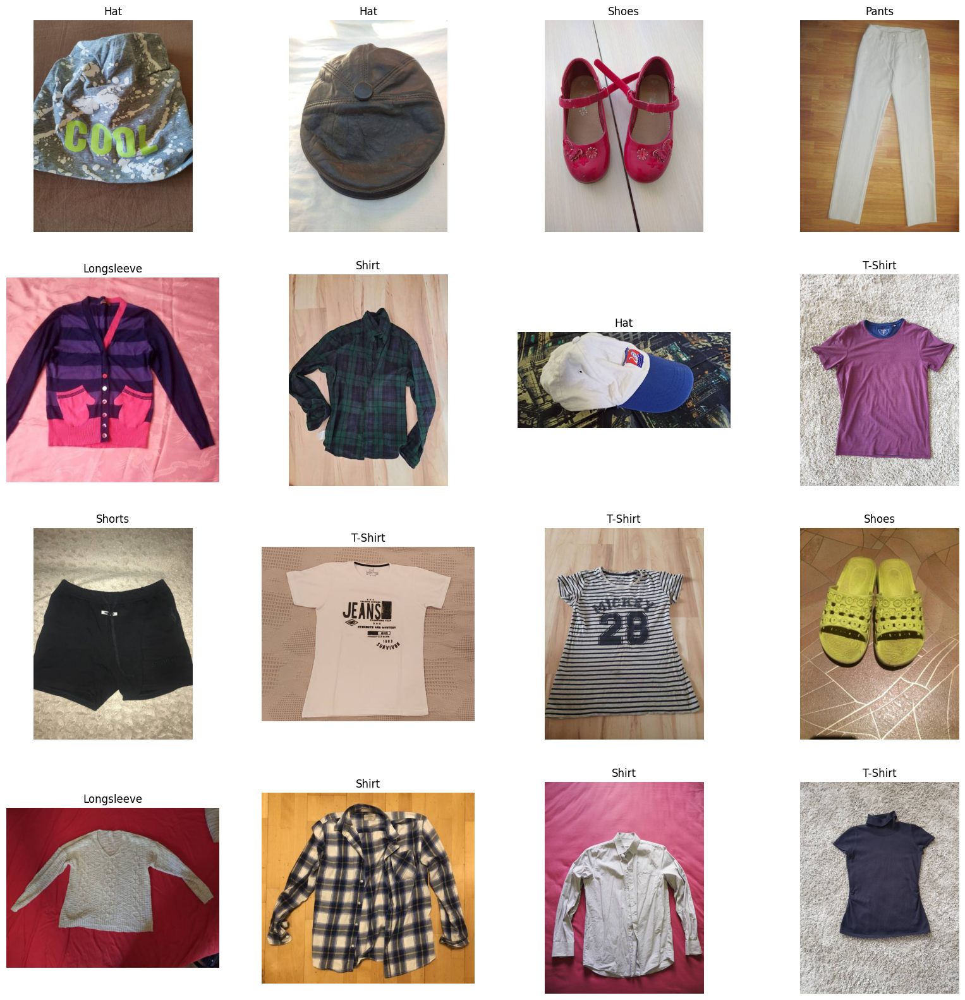

In [ ]:
plt.figure(figsize=(20, 20))
for i in range(16):
    ax = plt.subplot(4, 4, i+1)
    show_random_training_image()

In [ ]:
# Import the ImageDataGenerator from Keras
# This class helps in generating augmented image data that can be fed into a neural network

# Initialize the ImageDataGenerator for training data
# Here we specify all the different types of transformations that can be done on the images
train_datagen = ImageDataGenerator(rescale=1./255,
                                  rotation_range=40,
                                  width_shift_range=0.3,
                                  height_shift_range=0.3,
                                  zoom_range=0.3,
                                  horizontal_flip=True,
                                  validation_split=0.1)
# Generator for our training data
train_generator = train_datagen.flow_from_dataframe(
    dataframe=data_1,
    directory=TRAINING_DIR,
    x_col='image',
    y_col='label',
    target_size=IMAGE_SIZE,
    class_mode='categorical',
    batch_size=BATCH_SIZE,
    shuffle=True,
    subset='training'
)

# Generator for our validation data
validation_generator = train_datagen.flow_from_dataframe(
    dataframe=data_1,
    directory=TRAINING_DIR,
    x_col='image',
    y_col='label',
    target_size=IMAGE_SIZE,
    class_mode='categorical',
    batch_size=BATCH_SIZE,
    shuffle=False,
    subset='validation'
)

Found 4566 validated image filenames belonging to 16 classes.
Found 507 validated image filenames belonging to 16 classes.


In [ ]:
# Import MobileNetV2 from Keras Applications
from tensorflow.keras.applications.mobilenet_v2 import MobileNetV2
# Load the pre-trained MobileNetV2 model
# Set 'include_top' to False to remove the top layer, which was originally used to classify 1000 classes in ImageNet
pre_trained_model = MobileNetV2(input_shape=(224, 224, 3),
                                include_top=False,
                                weights='imagenet')

# Set each layer in the pre-trained model to be trainable
# This means that the weights of these layers will be updated to learn the specifics of the new task
for layer in pre_trained_model.layers:
    layer.trainable = True

# pre_trained_model.summary()

last_layer = pre_trained_model.get_layer('out_relu')
print('last layer output shape: ', last_layer.output_shape)
last_output = last_layer.output

9406464/9406464 [==============================] - 0s 0us/step
last layer output shape:  (None, 7, 7, 1280)


In [ ]:
# Flatten the output layer to 1 dimension
x = Flatten()(last_output)
x = Dropout(0.3)(x)

# Add a fully connected layer with 256 hidden units and a 'relu' activation function
# Also apply L2 regularization to the kernel matrix
x = Dense(256, activation='relu', kernel_regularizer='l2')(x)
x = Dropout(0.3)(x)
x = Dense(16, activation='softmax')(x)

# Configure and compile the model
# The inputs are the pre-trained MobileNetV2 model inputs and the outputs are the final Dense layer outputs
model = Model(pre_trained_model.input, x)

In [ ]:
learn_rate = LEARNING_RATE

es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)
cb = ModelCheckpoint('mobilenetv2.h5', save_best_only=True)
lrr = ReduceLROnPlateau(monitor='val_accuracy', factor=0.1, patience=5, min_lr=1e-5)

adam = Adam(learning_rate=learn_rate)
model.compile(loss='categorical_crossentropy', optimizer=adam, metrics=['accuracy'])

history = model.fit(train_generator, epochs=EPOCHS,
                    validation_data=validation_generator,
                    callbacks=[es, cb, lrr])

model = tf.keras.models.load_model('mobilenetv2.h5')

Epoch 1/100
143/143 [==============================] - 111s 522ms/step - loss: 6.8375 - accuracy: 0.2902 - val_loss: 5.1117 - val_accuracy: 0.1854 - lr: 0.0010
Epoch 2/100
143/143 [==============================] - 72s 501ms/step - loss: 3.6110 - accuracy: 0.3537 - val_loss: 5.3145 - val_accuracy: 0.1105 - lr: 0.0010
Epoch 3/100
143/143 [==============================] - 72s 502ms/step - loss: 2.7351 - accuracy: 0.4328 - val_loss: 13.5025 - val_accuracy: 0.0789 - lr: 0.0010
Epoch 4/100
143/143 [==============================] - 71s 498ms/step - loss: 2.9042 - accuracy: 0.4428 - val_loss: 7.5223 - val_accuracy: 0.1262 - lr: 0.0010
Epoch 5/100
143/143 [==============================] - 72s 504ms/step - loss: 3.1825 - accuracy: 0.4409 - val_loss: 3.6317 - val_accuracy: 0.1499 - lr: 0.0010
Epoch 6/100
143/143 [==============================] - 71s 499ms/step - loss: 2.4184 - accuracy: 0.5053 - val_loss: 3.8216 - val_accuracy: 0.1637 - lr: 0.0010
Epoch 7/100
143/143 [=======================

In [ ]:
loss, accuracy = model.evaluate(validation_generator, verbose=0)

In [ ]:
print(f"Model Loss is {loss:.2f} and Accuracy is {100*np.round(accuracy, 4)}%")

Model Loss is 0.93 and Accuracy is 73.96000000000001%


In [ ]:
def plot_loss_curves(history):
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    accuracy = history.history['accuracy']
    val_accuracy = history.history['val_accuracy']

    epochs = range(len(history.history['loss']))

    # Plot loss
    plt.plot(epochs, loss, label='training_loss')
    plt.plot(epochs, val_loss, label='val_loss')
    plt.title('Loss')
    plt.xlabel('Epochs')
    plt.legend()

    # Plot accuracy
    plt.figure()
    plt.plot(epochs, accuracy, label='training_accuracy')
    plt.plot(epochs, val_accuracy, label='val_accuracy')
    plt.title('Accuracy')
    plt.xlabel('Epochs')
    plt.legend()

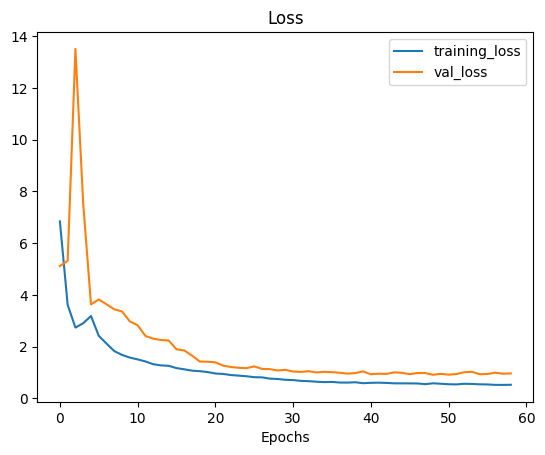

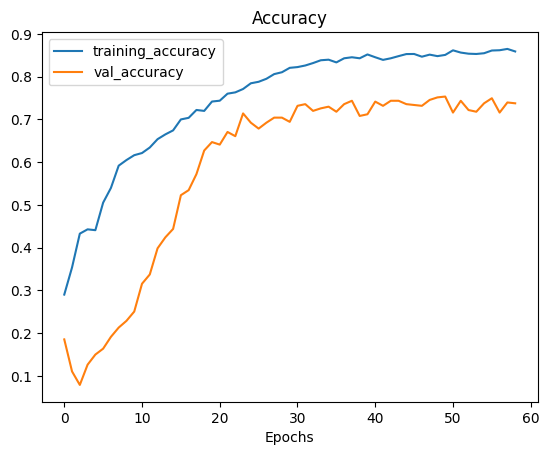

In [ ]:
plot_loss_curves(history)

In [ ]:
classes = list(train_generator.class_indices.keys())

In [ ]:
def predict_val_image(index):
    predictions =  model.predict(val_images, verbose=0)[index]
    true_label = classes[val_labels[index].argmax()]
    predicted_label = classes[predictions.argmax()]

    if(true_label== predicted_label):
        color = 'green'
    else:
        color = 'red'

    plt.title(f"True : {true_label} Predicted: {predicted_label}", color=color)
    plt.imshow(val_images[index])
    plt.axis('off')

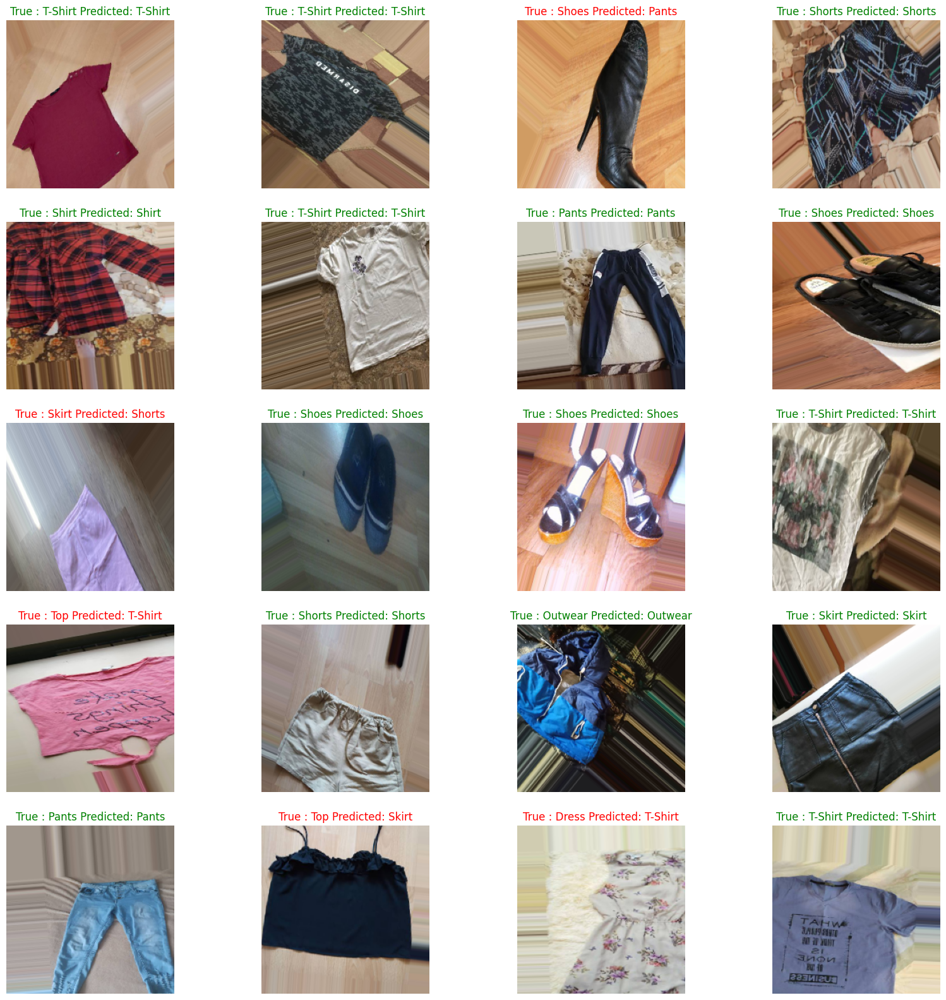

In [ ]:
val_images, val_labels = validation_generator.next()
plt.figure(figsize=(20, 20))
for i in range(20):
    ax = plt.subplot(5, 4, i + 1)
    predict_val_image(i)

In [ ]:
custom_dir = '/content/drive/MyDrive/clothes classification/images_original'

In [ ]:
custom_paths = []
for image in os.listdir(custom_dir):
        custom_paths.append(custom_dir+'/'+image)

In [ ]:
def predict_random_image():
    path = random.choice(custom_paths)
    image = tf.keras.preprocessing.image.load_img(path, target_size=(224, 224))
    input_arr = tf.keras.preprocessing.image.img_to_array(image)
    input_arr = np.array([input_arr])
    input_arr = input_arr.astype('float32') / 255.
    predictions = model.predict(input_arr, verbose=0)
    series = pd.Series(predictions[0], index=classes)
    predicted_classes = np.argsort(predictions)
    predictions.sort()
    plt.title(f"{classes[predicted_classes[0][-1]]} - {round(predictions[0][-1] * 100,2)}% \n{classes[predicted_classes[0][-2]]} - {round(predictions[0][-2] * 100,2)}% \n{classes[predicted_classes[0][-3]]} - {round(predictions[0][-2] * 100,3)}%")
    plt.imshow(image)
    plt.axis('off')

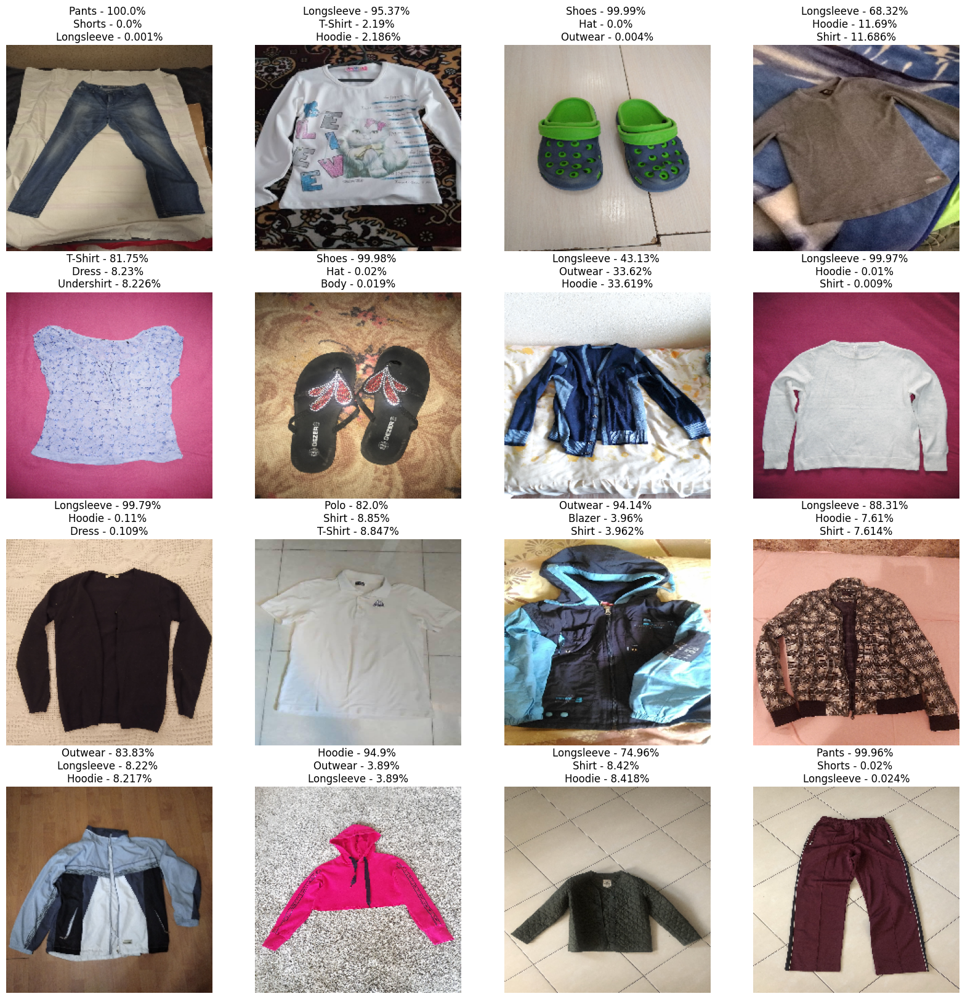

In [ ]:
plt.figure(figsize=(20, 20))
for i in range(16):
    ax = plt.subplot(4, 4, i + 1)
    predict_random_image()